## Loading the model

In [1]:
from train_utils import *
training_config, model_config, cluster_config = get_default_configs(random_string="NS2", wandb_project="")
dir_name = update_dir_name(model_config, training_config, cluster_config)

import torch
from model_model import TransformerModel
from model_electrode_embedding import ElectrodeEmbedding_Learned, ElectrodeEmbedding_NoisyCoordinate, ElectrodeEmbedding_Learned_CoordinateInit, ElectrodeDataEmbeddingFFT

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize model
model = TransformerModel(
    model_config['transformer']['d_model'],
    n_layers_electrode=model_config['transformer']['n_layers_electrode'],
    n_layers_time=model_config['transformer']['n_layers_time']
).to(device, dtype=model_config['dtype'])

# Initialize electrode embeddings based on config type
if model_config['electrode_embedding']['type'] == 'learned':
    electrode_embeddings = ElectrodeEmbedding_Learned(
        model_config['transformer']['d_model'],
        embedding_dim=model_config['electrode_embedding']['embedding_dim']
    )
elif model_config['electrode_embedding']['type'] == 'coordinate_init':
    electrode_embeddings = ElectrodeEmbedding_Learned_CoordinateInit(
        model_config['transformer']['d_model'],
        embedding_dim=model_config['electrode_embedding']['embedding_dim']
    )
elif model_config['electrode_embedding']['type'] == 'noisy_coordinate':
    electrode_embeddings = ElectrodeEmbedding_NoisyCoordinate(
        model_config['transformer']['d_model'],
        coordinate_noise_std=model_config['electrode_embedding']['coordinate_noise_std'],
        embedding_dim=model_config['electrode_embedding']['embedding_dim']
    )
else:
    raise ValueError(f"Invalid electrode embedding type: {model_config['electrode_embedding']['type']}")

electrode_embeddings = electrode_embeddings.to(device, dtype=model_config['dtype'])

electrode_data_embeddings = ElectrodeDataEmbeddingFFT(
    electrode_embeddings,
    model_config['sample_timebin_size']
).to(device, dtype=model_config['dtype'])

cluster_config['dir_name'] = cluster_config['dir_name']#.replace('_fb1', '') # remove the fb1 suffix

# Load saved model checkpoint
checkpoint = torch.load(f"models_data/{cluster_config['dir_name']}/model_epoch_100.pth", map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
electrode_data_embeddings.load_state_dict(checkpoint['electrode_data_embeddings_state_dict'])

model.eval()

TransformerModel(
  (electrode_transformer): Transformer(
    (embed): Linear(in_features=192, out_features=192, bias=False)
    (blocks): ModuleList(
      (0-4): 5 x Block(
        (attn): CausalSelfAttention(
          (c_q): Linear(in_features=192, out_features=192, bias=False)
          (c_k): Linear(in_features=192, out_features=192, bias=False)
          (c_v): Linear(in_features=192, out_features=192, bias=False)
          (c_proj): Linear(in_features=192, out_features=192, bias=False)
          (rotary): Rotary()
        )
        (mlp): MLP(
          (c_fc): Linear(in_features=192, out_features=768, bias=False)
          (c_proj): Linear(in_features=768, out_features=192, bias=False)
        )
      )
    )
    (output_proj): Linear(in_features=192, out_features=192, bias=False)
  )
  (time_transformer): Transformer(
    (embed): Linear(in_features=192, out_features=192, bias=False)
    (blocks): ModuleList(
      (0-4): 5 x Block(
        (attn): CausalSelfAttention(
      

## Loading the data aligned to the movie time

In [2]:
import os, json, pandas as pd
from btbench.btbench_config import *
movie_id = 'cars-2'
window_size_seconds = model_config['sample_timebin_size'] * model_config['max_n_timebins'] # size of the window for batch in the movie

subject_trials = [(10, 0), (3, 0), (7, 0)]
cache_subjects = True

transcript_file_format = os.path.join(ROOT_DIR, f'transcripts/{movie_id}/features.csv')
words_df = pd.read_csv(transcript_file_format.format(movie_id)).set_index('Unnamed: 0')
last_word_movie_time = words_df['end'].max().item()

# Create a dataframe with evenly spaced time points from 0 to last word time
time_points = np.arange(0, last_word_movie_time, window_size_seconds)
time_df = pd.DataFrame({'movie_time': time_points})

In [3]:
def add_subject_trial_idx(time_df, sub_id, trial_id):
    metadata_file = os.path.join(ROOT_DIR, f'subject_metadata/sub_{sub_id}_trial{trial_id:03}_metadata.json')
    with open(metadata_file, 'r') as f:
        meta_dict = json.load(f)
    assert meta_dict['filename'] == movie_id

    # Path to trigger times csv file
    trigger_times_file = os.path.join(ROOT_DIR, f'subject_timings/sub_{sub_id}_trial{trial_id:03}_timings.csv')
    trigs_df = pd.read_csv(trigger_times_file)

    # Vectorized sample index estimation
    trig_time_col, trig_idx_col, est_idx_col = 'movie_time', 'index', f'btbank{sub_id}_{trial_id}_idx'
    def add_estimated_sample_index_vectorized(w_df, t_df):
        last_t = t_df[trig_time_col].iloc[-1]
        last_t_idx = t_df[trig_idx_col].idxmax()
        w_df = w_df[w_df['movie_time']+window_size_seconds < last_t].copy()

        # Vectorized nearest trigger finding
        start_indices = np.searchsorted(t_df[trig_time_col].values, w_df['movie_time'].values)
        start_indices = np.maximum(start_indices, 0) # handle the edge case where movie starts right at the word
        
        # Vectorized sample index calculation
        w_df[est_idx_col] = np.round(
            t_df.loc[start_indices, trig_idx_col].values + 
            (w_df['movie_time'].values - t_df.loc[start_indices, trig_time_col].values) * SAMPLING_RATE
        )
        return w_df

    aligned_df = add_estimated_sample_index_vectorized(time_df, trigs_df)
    return pd.merge(time_df, aligned_df[['movie_time', est_idx_col]], on='movie_time', how='left')

for subject_id, trial_id in subject_trials:
    time_df = add_subject_trial_idx(time_df, subject_id, trial_id)
time_df

,movie_time,btbank10_0_idx,btbank3_0_idx,btbank7_0_idx
0,0.0,148150.0,723127.0,28933.0
1,3.0,154807.0,731233.0,35728.0
2,6.0,160981.0,737371.0,41908.0
3,9.0,167117.0,743513.0,48046.0
4,12.0,173254.0,749646.0,54185.0
...,...,...,...,...
1959,5877.0,NaN,13514427.0,12230998.0
1960,5880.0,NaN,13520569.0,12237150.0
1961,5883.0,NaN,13526707.0,12243246.0
1962,5886.0,NaN,13532880.0,12249383.0


In [4]:
from subject_braintreebank import BrainTreebankSubject
from torch.utils.data import Dataset
class SubjectTrialTimesDataset(Dataset):
    def __init__(self, subject, trial_id, times_df, window_size, dtype=torch.float32):
        """
        Args:
            subject (BrainTreebankSubject or MGHSubject): Subject object
            trial_id (int): Trial ID
            dtype (torch.dtype): Data type to load the data in (float32, bfloat16)
            window_size (int): Number of time samples per data item
        """
        self.subject = subject
        self.trial_id = trial_id
        self.window_size = window_size
        self.dtype = dtype
        self.times_df = times_df[~times_df[f'btbank{self.subject.subject_id}_{self.trial_id}_idx'].isna()]

        subject.load_neural_data(trial_id)
        self.n_windows = len(self.times_df)
    
    def __len__(self):
        return self.n_windows
    
    def __getitem__(self, idx):
        start_idx = int(self.times_df.iloc[idx][f'{self.subject.subject_identifier}_{self.trial_id}_idx'].item())
        end_idx = int(start_idx + self.window_size)
        window = self.subject.get_all_electrode_data(self.trial_id, start_idx, end_idx).to(dtype=self.dtype)
        return window

datasets = []
subjects = []
for subject_id, trial_id in subject_trials:
    print(f'Loading subject {subject_id} trial {trial_id}')
    subject = BrainTreebankSubject(subject_id, cache=cache_subjects)
    dataset = SubjectTrialTimesDataset(subject, trial_id, time_df, window_size_seconds*SAMPLING_RATE)
    datasets.append(dataset)
    subjects.append(subject)

Loading subject 10 trial 0


Loading subject 3 trial 0
Loading subject 7 trial 0


## Passing the data through the model to obtain the embeddings

In [5]:
import gc
gc.collect()
torch.cuda.empty_cache()


embeddings = []

batch_size = 1000

for subject_trial_i in range(len(datasets)):
    dataset = datasets[subject_trial_i]
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=False)
    subject = subjects[subject_trial_i]
    trial_id = subject_trials[subject_trial_i][1]

    print(f'Processing subject {subject.subject_id} trial {trial_id}')

    all_outputs = []
    with torch.no_grad():
        for batch in dataloader:
            batch = batch.to(device, dtype=model_config['dtype'])
            electrode_data = electrode_data_embeddings.forward(subject.subject_identifier, subject.get_electrode_indices(), batch)
            model_output = model(electrode_data, only_electrode_output=False)[0]
            all_outputs.append(model_output)
        
    model_output = torch.cat(all_outputs, dim=0).reshape(-1, model_config['transformer']['d_model'])
    embeddings.append(model_output)

Processing subject 10 trial 0
Processing subject 3 trial 0
Processing subject 7 trial 0


In [6]:
len(embeddings[0]), len(embeddings[1]), len(embeddings[2])

(38424, 47136, 47136)

In [7]:
# Perform PCA on embeddings
from sklearn.decomposition import PCA
import plotly.express as px
import numpy as np

# Convert embeddings to numpy if needed
PCA_N_every = 1
plot_N_every = 1
emb0 = embeddings[0][::PCA_N_every].float().cpu().numpy() if isinstance(embeddings[0], torch.Tensor) else embeddings[0][::PCA_N_every]
emb1 = embeddings[1][::PCA_N_every].float().cpu().numpy() if isinstance(embeddings[1], torch.Tensor) else embeddings[1][::PCA_N_every]
emb2 = embeddings[2][::PCA_N_every].float().cpu().numpy() if isinstance(embeddings[2], torch.Tensor) else embeddings[2][::PCA_N_every]

# Find minimum length among the three embeddings
min_length = min(len(emb0), len(emb1), len(emb2))
# Trim all embeddings to minimum length
emb0 = emb0[:min_length][::plot_N_every]
emb1 = emb1[:min_length][::plot_N_every] 
emb2 = emb2[:min_length][::plot_N_every]


# Combine embeddings for PCA
combined_embeddings = np.vstack([
    emb0,
    emb1,
    emb2
])

# Fit PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(combined_embeddings)

# Split back into separate embeddings
n_emb0_samples = len(emb0)
n_emb1_samples = len(emb1)
pca_emb0 = pca_result[:n_emb0_samples]
pca_emb1 = pca_result[n_emb0_samples:n_emb0_samples+n_emb1_samples]
pca_emb2 = pca_result[n_emb0_samples+n_emb1_samples:]

# Create time arrays
time_emb0 = np.arange(len(pca_emb0)) * PCA_N_every * plot_N_every
time_emb1 = np.arange(len(pca_emb1)) * PCA_N_every * plot_N_every
time_emb2 = np.arange(len(pca_emb2)) * PCA_N_every * plot_N_every

# Create DataFrame for plotting
df_plot = pd.DataFrame({
    'PC1': np.concatenate([pca_emb0[:, 0], pca_emb1[:, 0], pca_emb2[:, 0]]),
    'PC2': np.concatenate([pca_emb0[:, 1], pca_emb1[:, 1], pca_emb2[:, 1]]),
    'PC3': np.concatenate([pca_emb0[:, 2], pca_emb1[:, 2], pca_emb2[:, 2]]),
    'Subject': [subjects[0].subject_identifier] * len(pca_emb0) + [subjects[1].subject_identifier] * len(pca_emb1) + [subjects[2].subject_identifier] * len(pca_emb2),
    'Time': np.concatenate([time_emb0, time_emb1, time_emb2])
})

# Create interactive 3D scatter plot
fig = px.scatter_3d(
    df_plot,
    x='PC1',
    y='PC2', 
    z='PC3',
    color='Subject',
    title='First 3 PCs of Neural Embeddings',
    labels={'PC1': 'First PC', 'PC2': 'Second PC', 'PC3': 'Third PC'},
    opacity=1,
    width=900,
    height=500,
    size_max=1,
    color_continuous_scale='viridis'
)

# Save interactive plot to HTML file
fig.write_html("analyses/movie_alignment.html")

fig.update_traces(marker=dict(size=3))
fig.show()

# Print explained variance ratio
print("Explained variance ratio:", pca.explained_variance_ratio_)


Explained variance ratio: [0.3361096  0.10995352 0.05307506]


In [8]:
# Convert embeddings to numpy if needed
PCA_N_every = 1
plot_N_every = 1
emb0 = embeddings[0][::PCA_N_every].float().cpu().numpy() if isinstance(embeddings[0], torch.Tensor) else embeddings[0][::PCA_N_every]
emb1 = embeddings[1][::PCA_N_every].float().cpu().numpy() if isinstance(embeddings[1], torch.Tensor) else embeddings[1][::PCA_N_every]
emb2 = embeddings[2][::PCA_N_every].float().cpu().numpy() if isinstance(embeddings[2], torch.Tensor) else embeddings[2][::PCA_N_every]

# Find minimum length among the three embeddings
min_length = min(len(emb0), len(emb1), len(emb2))
# Trim all embeddings to minimum length
emb0 = emb0[:min_length][::plot_N_every]
emb1 = emb1[:min_length][::plot_N_every] 
emb2 = emb2[:min_length][::plot_N_every]

N_nearest_neighbors = 5
from sklearn.neighbors import NearestNeighbors

# Initialize nearest neighbor models for each embedding
nn0 = NearestNeighbors(n_neighbors=N_nearest_neighbors+1)  # +1 since point is its own nearest neighbor
nn1 = NearestNeighbors(n_neighbors=N_nearest_neighbors+1)
nn2 = NearestNeighbors(n_neighbors=N_nearest_neighbors+1)

# Fit models
nn0.fit(emb0)
nn1.fit(emb1) 
nn2.fit(emb2)

# Find nearest neighbors for each point
# Returns distances and indices, we only keep indices
_, nn_indices0 = nn0.kneighbors(emb0)
_, nn_indices1 = nn1.kneighbors(emb1)
_, nn_indices2 = nn2.kneighbors(emb2)

# Remove self-reference (first column) since each point is its own nearest neighbor
nn_indices0 = nn_indices0[:, 1:]  # Shape: (n_samples, N_nearest_neighbors)
nn_indices1 = nn_indices1[:, 1:]
nn_indices2 = nn_indices2[:, 1:]

In [9]:
# Function to compute overlap between two lists
def compute_overlap(list1, list2):
    set1 = set(list1)
    set2 = set(list2)
    return len(set1.intersection(set2)) / len(set1)

# Compute pairwise overlaps for each sample
overlaps_01 = [compute_overlap(nn_indices0[i], nn_indices1[i]) for i in range(len(nn_indices0))]
overlaps_02 = [compute_overlap(nn_indices0[i], nn_indices2[i]) for i in range(len(nn_indices0))]
overlaps_12 = [compute_overlap(nn_indices1[i], nn_indices2[i]) for i in range(len(nn_indices1))]

# Calculate mean overlaps
mean_overlap_01 = np.mean(overlaps_01)
mean_overlap_02 = np.mean(overlaps_02)
mean_overlap_12 = np.mean(overlaps_12)

print("Mean overlap between embeddings 0 and 1:", mean_overlap_01)
print("Mean overlap between embeddings 0 and 2:", mean_overlap_02)
print("Mean overlap between embeddings 1 and 2:", mean_overlap_12)

# Calculate expected random overlap
n_samples = len(nn_indices0)
n_neighbors = N_nearest_neighbors

# For random selection, probability of overlap is:
# (n_neighbors / (n_samples-1)) since we exclude self from n_samples
random_overlap = n_neighbors / (n_samples - 1)

print("\nExpected random overlap:", random_overlap)
print("Actual overlaps are {:.1f}x, {:.1f}x, and {:.1f}x higher than random"
      .format(mean_overlap_01/random_overlap, 
              mean_overlap_02/random_overlap,
              mean_overlap_12/random_overlap))

Mean overlap between embeddings 0 and 1: 0.0038101186758276078
Mean overlap between embeddings 0 and 2: 0.009941703102227775
Mean overlap between embeddings 1 and 2: 0.00624089110972309

Expected random overlap: 0.00013013039065143273
Actual overlaps are 29.3x, 76.4x, and 48.0x higher than random


In [10]:
cepochs = [20, 40, 60, 80, 100]
results = {
    'epochs': cepochs,
    'overlap_01': [],
    'overlap_02': [], 
    'overlap_12': [],
    'random_overlap': None
}

for epoch in cepochs:
    print(f"Loading model from epoch {epoch}")
    # Load saved model checkpoint
    checkpoint = torch.load(f"models_data/{cluster_config['dir_name']}/model_epoch_{epoch}.pth", map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    electrode_data_embeddings.load_state_dict(checkpoint['electrode_data_embeddings_state_dict'])
    model.eval()

    import gc
    gc.collect()
    torch.cuda.empty_cache()

    embeddings = []
    batch_size = 1000
    for subject_trial_i in range(len(datasets)):
        dataset = datasets[subject_trial_i]
        dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=False)
        subject = subjects[subject_trial_i]
        trial_id = subject_trials[subject_trial_i][1]

        print(f'Processing subject {subject.subject_id} trial {trial_id}')

        all_outputs = []
        with torch.no_grad():
            for batch in dataloader:
                batch = batch.to(device, dtype=model_config['dtype'])
                electrode_data = electrode_data_embeddings.forward(subject.subject_identifier, subject.get_electrode_indices(), batch)
                model_output = model(electrode_data, only_electrode_output=False)[0]
                all_outputs.append(model_output)
            
        model_output = torch.cat(all_outputs, dim=0).reshape(-1, model_config['transformer']['d_model'])
        embeddings.append(model_output)

    # Convert embeddings to numpy if needed
    PCA_N_every = 1
    plot_N_every = 1
    emb0 = embeddings[0][::PCA_N_every].float().cpu().numpy() if isinstance(embeddings[0], torch.Tensor) else embeddings[0][::PCA_N_every]
    emb1 = embeddings[1][::PCA_N_every].float().cpu().numpy() if isinstance(embeddings[1], torch.Tensor) else embeddings[1][::PCA_N_every]
    emb2 = embeddings[2][::PCA_N_every].float().cpu().numpy() if isinstance(embeddings[2], torch.Tensor) else embeddings[2][::PCA_N_every]

    # Find minimum length among the three embeddings
    min_length = min(len(emb0), len(emb1), len(emb2))
    # Trim all embeddings to minimum length
    emb0 = emb0[:min_length][::plot_N_every]
    emb1 = emb1[:min_length][::plot_N_every] 
    emb2 = emb2[:min_length][::plot_N_every]

    N_nearest_neighbors = 5
    from sklearn.neighbors import NearestNeighbors

    # Initialize nearest neighbor models for each embedding
    nn0 = NearestNeighbors(n_neighbors=N_nearest_neighbors+1)  # +1 since point is its own nearest neighbor
    nn1 = NearestNeighbors(n_neighbors=N_nearest_neighbors+1)
    nn2 = NearestNeighbors(n_neighbors=N_nearest_neighbors+1)

    # Fit models
    nn0.fit(emb0)
    nn1.fit(emb1) 
    nn2.fit(emb2)

    # Find nearest neighbors for each point
    # Returns distances and indices, we only keep indices
    _, nn_indices0 = nn0.kneighbors(emb0)
    _, nn_indices1 = nn1.kneighbors(emb1)
    _, nn_indices2 = nn2.kneighbors(emb2)

    # Remove self-reference (first column) since each point is its own nearest neighbor
    nn_indices0 = nn_indices0[:, 1:]  # Shape: (n_samples, N_nearest_neighbors)
    nn_indices1 = nn_indices1[:, 1:]
    nn_indices2 = nn_indices2[:, 1:]

    # Function to compute overlap between two lists
    def compute_overlap(list1, list2):
        set1 = set(list1)
        set2 = set(list2)
        return len(set1.intersection(set2)) / len(set1)

    # Compute pairwise overlaps for each sample
    overlaps_01 = [compute_overlap(nn_indices0[i], nn_indices1[i]) for i in range(len(nn_indices0))]
    overlaps_02 = [compute_overlap(nn_indices0[i], nn_indices2[i]) for i in range(len(nn_indices0))]
    overlaps_12 = [compute_overlap(nn_indices1[i], nn_indices2[i]) for i in range(len(nn_indices1))]

    # Calculate mean overlaps
    mean_overlap_01 = np.mean(overlaps_01)
    mean_overlap_02 = np.mean(overlaps_02)
    mean_overlap_12 = np.mean(overlaps_12)

    # Store results
    results['overlap_01'].append(mean_overlap_01)
    results['overlap_02'].append(mean_overlap_02)
    results['overlap_12'].append(mean_overlap_12)

    print("Mean overlap between embeddings 0 and 1:", mean_overlap_01)
    print("Mean overlap between embeddings 0 and 2:", mean_overlap_02)
    print("Mean overlap between embeddings 1 and 2:", mean_overlap_12)

    # Calculate expected random overlap
    n_samples = len(nn_indices0)
    n_neighbors = N_nearest_neighbors

    # For random selection, probability of overlap is:
    # (n_neighbors / (n_samples-1)) since we exclude self from n_samples
    random_overlap = n_neighbors / (n_samples - 1)
    if results['random_overlap'] is None:
        results['random_overlap'] = random_overlap

    print("\nExpected random overlap:", random_overlap)
    print("Actual overlaps are {:.1f}x, {:.1f}x, and {:.1f}x higher than random"
        .format(mean_overlap_01/random_overlap, 
                mean_overlap_02/random_overlap,
                mean_overlap_12/random_overlap))
    
    print("================================================")

Loading model from epoch 20
Processing subject 10 trial 0
Processing subject 3 trial 0
Processing subject 7 trial 0
Mean overlap between embeddings 0 and 1: 0.0016656256506350198
Mean overlap between embeddings 0 and 2: 0.005288361440766188
Mean overlap between embeddings 1 and 2: 0.002186133666458463

Expected random overlap: 0.00013013039065143273
Actual overlaps are 12.8x, 40.6x, and 16.8x higher than random
Loading model from epoch 40
Processing subject 10 trial 0
Processing subject 3 trial 0
Processing subject 7 trial 0
Mean overlap between embeddings 0 and 1: 0.002873204247345409
Mean overlap between embeddings 0 and 2: 0.007776389756402249
Mean overlap between embeddings 1 and 2: 0.003909015198834062

Expected random overlap: 0.00013013039065143273
Actual overlaps are 22.1x, 59.8x, and 30.0x higher than random
Loading model from epoch 60
Processing subject 10 trial 0
Processing subject 3 trial 0
Processing subject 7 trial 0
Mean overlap between embeddings 0 and 1: 0.003315636060

In [30]:
cepochs = [20, 40, 60, 80, 100]
results = {
    'epochs': cepochs,
    'overlap_01': [],
    'overlap_02': [], 
    'overlap_12': [],
    'random_overlap': None
}

for epoch in cepochs:
    print(f"Loading model from epoch {epoch}")
    # Load saved model checkpoint
    checkpoint = torch.load(f"models_data/{cluster_config['dir_name']}/model_epoch_{epoch}.pth", map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    electrode_data_embeddings.load_state_dict(checkpoint['electrode_data_embeddings_state_dict'])
    model.eval()

    import gc
    gc.collect()
    torch.cuda.empty_cache()

    embeddings = []
    batch_size = 1000
    for subject_trial_i in range(len(datasets)):
        dataset = datasets[subject_trial_i]
        dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=False)
        subject = subjects[subject_trial_i]
        trial_id = subject_trials[subject_trial_i][1]

        print(f'Processing subject {subject.subject_id} trial {trial_id}')

        all_outputs = []
        with torch.no_grad():
            for batch in dataloader:
                batch = batch.to(device, dtype=model_config['dtype'])
                electrode_data = electrode_data_embeddings.forward(subject.subject_identifier, subject.get_electrode_indices(), batch)
                model_output = model(electrode_data, only_electrode_output=False)[0]
                all_outputs.append(model_output)
            
        model_output = torch.cat(all_outputs, dim=0).reshape(-1, model_config['transformer']['d_model'])
        embeddings.append(model_output)

    # Convert embeddings to numpy if needed
    PCA_N_every = 1
    plot_N_every = 1
    emb0 = embeddings[0][::PCA_N_every].float().cpu().numpy() if isinstance(embeddings[0], torch.Tensor) else embeddings[0][::PCA_N_every]
    emb1 = embeddings[1][::PCA_N_every].float().cpu().numpy() if isinstance(embeddings[1], torch.Tensor) else embeddings[1][::PCA_N_every]
    emb2 = embeddings[2][::PCA_N_every].float().cpu().numpy() if isinstance(embeddings[2], torch.Tensor) else embeddings[2][::PCA_N_every]

    # Find minimum length among the three embeddings
    min_length = min(len(emb0), len(emb1), len(emb2))
    # Trim all embeddings to minimum length
    emb0 = emb0[:min_length][::plot_N_every]
    emb1 = emb1[:min_length][::plot_N_every] 
    emb2 = emb2[:min_length][::plot_N_every]

    N_nearest_neighbors = 5
    # Convert embeddings to torch tensors
    emb0_tensor = torch.from_numpy(emb0).to(device)
    emb1_tensor = torch.from_numpy(emb1).to(device)
    emb2_tensor = torch.from_numpy(emb2).to(device)

    # Get nearest neighbors for each embedding
    
    def get_nearest_neighbors(x, k, k_remove=1000):
        # Scale the entire dataset by a common factor to prevent overflow
        # Using the mean magnitude across all samples
        scale_factor = torch.sqrt((x * x).sum())
        x_scaled = x / (scale_factor)
        
        # Calculate pairwise Euclidean distances using the scaled vectors
        x_norm = (x_scaled * x_scaled).sum(dim=1, keepdim=True)  # Shape: (n, 1)
        dist = x_norm + x_norm.T - 2 * torch.matmul(x_scaled, x_scaled.T)
        
        # Mask out indices within k_remove of each point
        n = x.shape[0]
        mask = torch.ones_like(dist, dtype=torch.bool)
        for i in range(n):
            left_idx = max(0, i - k_remove)
            right_idx = min(n, i + k_remove + 1)
            mask[i, left_idx:right_idx] = False
        
        # Set masked distances to infinity so they won't be selected
        dist = dist.masked_fill(~mask, float('inf'))
        
        # Get top k nearest neighbors (excluding masked neighbors)
        return torch.topk(dist, k=k, dim=1, largest=False)[1]
    nn_indices0 = get_nearest_neighbors(emb0_tensor, k=N_nearest_neighbors)
    nn_indices1 = get_nearest_neighbors(emb1_tensor, k=N_nearest_neighbors) 
    nn_indices2 = get_nearest_neighbors(emb2_tensor, k=N_nearest_neighbors)

    # Convert back to numpy arrays
    nn_indices0 = nn_indices0.cpu().numpy()
    nn_indices1 = nn_indices1.cpu().numpy()
    nn_indices2 = nn_indices2.cpu().numpy()

    # Function to compute overlap between two lists
    def compute_overlap(list1, list2):
        set1 = set(list1)
        set2 = set(list2)
        return len(set1.intersection(set2)) / len(set1)

    # Compute pairwise overlaps for each sample
    overlaps_01 = [compute_overlap(nn_indices0[i], nn_indices1[i]) for i in range(len(nn_indices0))]
    overlaps_02 = [compute_overlap(nn_indices0[i], nn_indices2[i]) for i in range(len(nn_indices0))]
    overlaps_12 = [compute_overlap(nn_indices1[i], nn_indices2[i]) for i in range(len(nn_indices1))]

    # Calculate mean overlaps
    mean_overlap_01 = np.mean(overlaps_01)
    mean_overlap_02 = np.mean(overlaps_02)
    mean_overlap_12 = np.mean(overlaps_12)

    # Store results
    results['overlap_01'].append(mean_overlap_01)
    results['overlap_02'].append(mean_overlap_02)
    results['overlap_12'].append(mean_overlap_12)

    print("Mean overlap between embeddings 0 and 1:", mean_overlap_01)
    print("Mean overlap between embeddings 0 and 2:", mean_overlap_02)
    print("Mean overlap between embeddings 1 and 2:", mean_overlap_12)

    # Calculate expected random overlap
    n_samples = len(nn_indices0)
    n_neighbors = N_nearest_neighbors

    # For random selection, probability of overlap is:
    # (n_neighbors / (n_samples-1)) since we exclude self from n_samples
    random_overlap = n_neighbors / (n_samples - 1)
    if results['random_overlap'] is None:
        results['random_overlap'] = random_overlap

    print("\nExpected random overlap:", random_overlap)
    print("Actual overlaps are {:.1f}x, {:.1f}x, and {:.1f}x higher than random"
        .format(mean_overlap_01/random_overlap, 
                mean_overlap_02/random_overlap,
                mean_overlap_12/random_overlap))
    
    print("================================================")

Loading model from epoch 20
Processing subject 10 trial 0
Processing subject 3 trial 0
Processing subject 7 trial 0
Mean overlap between embeddings 0 and 1: 0.00014574224443056425
Mean overlap between embeddings 0 and 2: 0.00019258796585467416
Mean overlap between embeddings 1 and 2: 0.00015094732458879867

Expected random overlap: 0.00013013039065143273
Actual overlaps are 1.1x, 1.5x, and 1.2x higher than random
Loading model from epoch 40
Processing subject 10 trial 0
Processing subject 3 trial 0
Processing subject 7 trial 0
Mean overlap between embeddings 0 and 1: 0.00023943368727878406
Mean overlap between embeddings 0 and 2: 0.00015094732458879867
Mean overlap between embeddings 1 and 2: 0.000166562565063502

Expected random overlap: 0.00013013039065143273
Actual overlaps are 1.8x, 1.2x, and 1.3x higher than random
Loading model from epoch 60
Processing subject 10 trial 0
Processing subject 3 trial 0
Processing subject 7 trial 0
Mean overlap between embeddings 0 and 1: 0.000130127

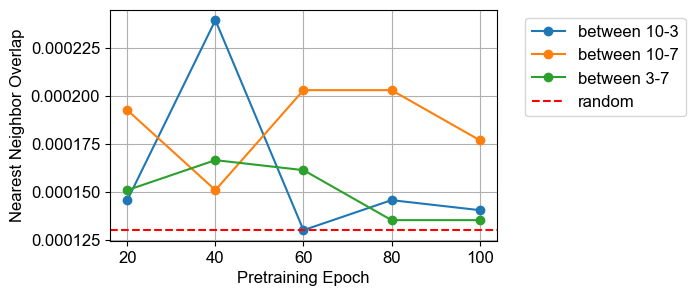

In [31]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
font_path = 'analyses/font_arial.ttf'
fm.fontManager.addfont(font_path)
plt.rcParams['font.family'] = 'Arial'
plt.rcParams.update({'font.size': 12})

# Plot results
plt.figure(figsize=(5, 3))
plt.plot(results['epochs'], results['overlap_01'], '-o', label='between 10-3')
plt.plot(results['epochs'], results['overlap_02'], '-o', label='between 10-7')
plt.plot(results['epochs'], results['overlap_12'], '-o', label='between 3-7')
plt.axhline(y=results['random_overlap'], color='r', linestyle='--', label='random')

#plt.xscale('log')


plt.xlabel('Pretraining Epoch')
plt.ylabel('Nearest Neighbor Overlap')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

In [12]:
import gc
print("Starting garbage collection...")
gc.collect()
print("Clearing CUDA cache...")
torch.cuda.empty_cache()

# Calculate nearest neighbors on raw voltage traces instead of embeddings
PCA_N_every = 1
plot_N_every = 1
print(f"Using PCA_N_every={PCA_N_every}, plot_N_every={plot_N_every}")

# Get raw voltage traces from datasets
print("Loading raw voltage traces from datasets...")
raw_traces = []
for i, dataset in enumerate(datasets):
    print(f"Processing dataset {i}...")
    # Get all data from dataset
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=len(dataset), shuffle=False)
    batch = next(iter(dataloader))
    batch_size, n_channels, n_samples = batch.shape

    batch = batch.cpu().numpy().reshape(batch_size, n_channels, n_samples//256, 256)
    batch = batch.transpose(0, 2, 1, 3).reshape(batch_size * (n_samples//256), n_channels, 256).reshape(batch_size * (n_samples//256), n_channels * 256)

    raw_traces.append(batch)
    print(f"Dataset {i} shape:", raw_traces[-1].shape)

# Subsample and flatten the traces
print("\nSubsampling and flattening traces...")
trace0 = raw_traces[0][::PCA_N_every].reshape(raw_traces[0][::PCA_N_every].shape[0], -1)
trace1 = raw_traces[1][::PCA_N_every].reshape(raw_traces[1][::PCA_N_every].shape[0], -1) 
trace2 = raw_traces[2][::PCA_N_every].reshape(raw_traces[2][::PCA_N_every].shape[0], -1)
print("Trace shapes after flattening:")
print("Trace 0:", trace0.shape)
print("Trace 1:", trace1.shape) 
print("Trace 2:", trace2.shape)

# Find minimum length among the three traces
min_length = min(len(trace0), len(trace1), len(trace2))
print(f"\nTrimming all traces to minimum length: {min_length}")
# Trim all traces to minimum length
trace0 = trace0[:min_length][::plot_N_every]
trace1 = trace1[:min_length][::plot_N_every]
trace2 = trace2[:min_length][::plot_N_every]
print("Final trace shapes:")
print("Trace 0:", trace0.shape)
print("Trace 1:", trace1.shape)
print("Trace 2:", trace2.shape)

Starting garbage collection...
Clearing CUDA cache...
Using PCA_N_every=1, plot_N_every=1
Loading raw voltage traces from datasets...
Processing dataset 0...
Dataset 0 shape: (38424, 52992)
Processing dataset 1...
Dataset 1 shape: (47136, 31744)
Processing dataset 2...
Dataset 2 shape: (47136, 61440)

Subsampling and flattening traces...
Trace shapes after flattening:
Trace 0: (38424, 52992)
Trace 1: (47136, 31744)
Trace 2: (47136, 61440)

Trimming all traces to minimum length: 38424
Final trace shapes:
Trace 0: (38424, 52992)
Trace 1: (38424, 31744)
Trace 2: (38424, 61440)


In [32]:
import gc
print("Starting garbage collection...")
gc.collect()
print("Clearing CUDA cache...")
torch.cuda.empty_cache()

N_nearest_neighbors = 5
print(f"\nFinding {N_nearest_neighbors} nearest neighbors...")

# Convert traces to tensors and move to GPU
print("Moving data to GPU...")
trace0_tensor = torch.from_numpy(trace0).float().cuda()
trace1_tensor = torch.from_numpy(trace1).float().cuda()
trace2_tensor = torch.from_numpy(trace2).float().cuda()

print("Finding nearest neighbors on GPU...")
with torch.no_grad():
    with torch.cuda.amp.autocast():
        nn_indices0 = get_nearest_neighbors(trace0_tensor, N_nearest_neighbors)
        print("Completed trace 0. Shape:", nn_indices0.shape)
        nn_indices1 = get_nearest_neighbors(trace1_tensor, N_nearest_neighbors)
        print("Completed trace 1. Shape:", nn_indices1.shape)
        nn_indices2 = get_nearest_neighbors(trace2_tensor, N_nearest_neighbors)
        print("Completed trace 2. Shape:", nn_indices2.shape)

print("Moving results back to CPU...")
nn_indices0 = nn_indices0.cpu().numpy()
nn_indices1 = nn_indices1.cpu().numpy()
nn_indices2 = nn_indices2.cpu().numpy()

print("Done finding nearest neighbors.")

print(nn_indices0)
print(nn_indices1)
print(nn_indices2)

# Remove self-reference 
print("Removing self-references...")
nn_indices0 = nn_indices0[:, 1:]
nn_indices1 = nn_indices1[:, 1:]
nn_indices2 = nn_indices2[:, 1:]

# Function to compute overlap between two lists
def compute_overlap(list1, list2):
    set1 = set(list1)
    set2 = set(list2)
    return len(set1.intersection(set2)) / len(set1)

# Compute pairwise overlaps for each sample
print("\nComputing pairwise overlaps...")
overlaps_01 = [compute_overlap(nn_indices0[i], nn_indices1[i]) for i in range(len(nn_indices0))]
overlaps_02 = [compute_overlap(nn_indices0[i], nn_indices2[i]) for i in range(len(nn_indices0))]
overlaps_12 = [compute_overlap(nn_indices1[i], nn_indices2[i]) for i in range(len(nn_indices1))]

# Calculate mean overlaps
print("Calculating mean overlaps...")
mean_overlap_01_raw = np.mean(overlaps_01)
mean_overlap_02_raw = np.mean(overlaps_02)
mean_overlap_12_raw = np.mean(overlaps_12)

print("\nRaw voltage trace overlaps:")
print("Mean overlap between traces 0 and 1:", mean_overlap_01_raw)
print("Mean overlap between traces 0 and 2:", mean_overlap_02_raw)
print("Mean overlap between traces 1 and 2:", mean_overlap_12_raw)

# Calculate expected random overlap
print("\nCalculating expected random overlap...")
n_samples = len(nn_indices0)
n_neighbors = N_nearest_neighbors
random_overlap = n_neighbors / (n_samples - 1)

print("\nExpected random overlap:", random_overlap)
print("Raw voltage trace overlaps are {:.1f}x, {:.1f}x, and {:.1f}x higher than random"
    .format(mean_overlap_01_raw/random_overlap,
            mean_overlap_02_raw/random_overlap,
            mean_overlap_12_raw/random_overlap))

results['overlap_01_raw'] = mean_overlap_01_raw
results['overlap_02_raw'] = mean_overlap_02_raw
results['overlap_12_raw'] = mean_overlap_12_raw


Starting garbage collection...
Clearing CUDA cache...

Finding 5 nearest neighbors...
Moving data to GPU...
Finding nearest neighbors on GPU...


/tmp/ipykernel_1592859/818957387.py:18: FutureWarning:

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.



Completed trace 0. Shape: torch.Size([38424, 5])
Completed trace 1. Shape: torch.Size([38424, 5])
Completed trace 2. Shape: torch.Size([38424, 5])
Moving results back to CPU...
Done finding nearest neighbors.
[[14256 30416 31053 26234  8603]
 [19644 35895 23021 17137 14240]
 [30068 20678 15612 19645 18769]
 ...
 [21003 10412 20843 32060 30033]
 [37236   653 16340 34868 33669]
 [35824 34341  3383  8056 18045]]
[[21183 28573 28574  2433  1090]
 [19953  2995 34120  2826  2899]
 [34238 28310 10436 14610 23819]
 ...
 [  412 11495 21662 11516 21679]
 [ 1534 30375 12605 24529 34307]
 [13060 31288 18785  6121 34119]]
[[24222 30578 10080 24697 36191]
 [30578 32899 34121 36191 17811]
 [24014 21357 32901  2053  4346]
 ...
 [34482  1579 29085  1578 16994]
 [25083  1573 34483  5148  5166]
 [25084 18613  6993 30109 30060]]
Removing self-references...

Computing pairwise overlaps...
Calculating mean overlaps...

Raw voltage trace overlaps:
Mean overlap between traces 0 and 1: 0.00016265875494482615
M

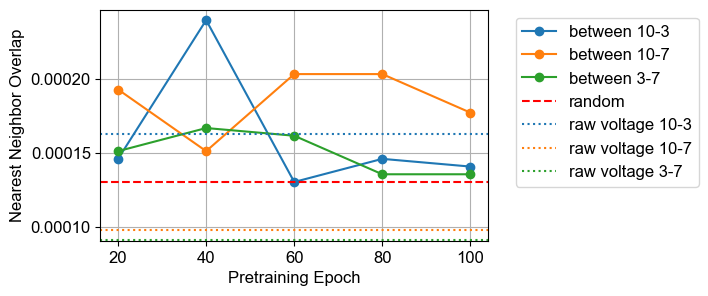

In [34]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
font_path = 'analyses/font_arial.ttf'
fm.fontManager.addfont(font_path)
plt.rcParams['font.family'] = 'Arial'
plt.rcParams.update({'font.size': 12})

# Plot results
plt.figure(figsize=(5, 3))
plt.plot(results['epochs'], results['overlap_01'], '-o', label='between 10-3')
plt.plot(results['epochs'], results['overlap_02'], '-o', label='between 10-7')
plt.plot(results['epochs'], results['overlap_12'], '-o', label='between 3-7')
plt.axhline(y=results['random_overlap'], color='r', linestyle='--', label='random')
plt.axhline(y=results['overlap_01_raw'], color='C0', linestyle=':', label='raw voltage 10-3')
plt.axhline(y=results['overlap_02_raw'], color='C1', linestyle=':', label='raw voltage 10-7')
plt.axhline(y=results['overlap_12_raw'], color='C2', linestyle=':', label='raw voltage 3-7')


#plt.xscale('log')


plt.xlabel('Pretraining Epoch')
plt.ylabel('Nearest Neighbor Overlap')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()